In [1]:
%cd ..
%ls

/home/nas3_userJ/dmkim/OnlineTSAD
cfgs/         EDA/      hptune/  outputs/  test.py*       utils/
checkpoints/  Exp/      logs/    plots/    thresholding/  Vis/
data/         figures/  models/  results/  train.py*      wandb/


In [4]:
import torch
from torch import optim
import torch.nn.functional as F

import matplotlib.pyplot as plt

from utils.metrics import get_summary_stats

from models.MLP import MLP

import wandb
import hydra
from omegaconf import DictConfig

from utils.logger import make_logger
from utils.argpass import prepare_arguments, configure_exp_id
from utils.tools import SEED_everything, plot_interval

import warnings
from data.load_data import DataFactory
from Exp.ReconBaselines import *

from easydict import EasyDict as edict
import yaml
import re
import copy

warnings.filterwarnings("ignore")

In [5]:
# load yaml
cfg = {}
loader = yaml.SafeLoader
loader.add_implicit_resolver(
    u'tag:yaml.org,2002:float',
    re.compile(u'''^(?:
     [-+]?(?:[0-9][0-9_]*)\\.[0-9_]*(?:[eE][-+]?[0-9]+)?
    |[-+]?(?:[0-9][0-9_]*)(?:[eE][-+]?[0-9]+)
    |\\.[0-9_]+(?:[eE][-+][0-9]+)?
    |[-+]?[0-9][0-9_]*(?::[0-5]?[0-9])+\\.[0-9_]*
    |[-+]?\\.(?:inf|Inf|INF)
    |\\.(?:nan|NaN|NAN))$''', re.X),
    list(u'-+0123456789.'))

# get cfg
model = "MLP"
with open("cfgs/test_defaults.yaml", "r") as file:
    basic_config = yaml.load(file, Loader=loader)
    cfg.update(basic_config)
with open(f"cfgs/model/{model}.yaml", "r") as file:
    model_config = yaml.load(file, Loader=loader)
    cfg.update({"model": model_config})
cfg['dataset'] = 'MSL_P-15'
cfg["normalization"] = 'SlowRevIN'
cfg["gamma"] = 0.9

In [6]:
args = prepare_arguments(cfg)
args.model.latent_dim = 16
args.window_size = 12
args.eval_batch_size = 1
args.dataset = "MSL_P-15"
print(args)

logger = make_logger(os.path.join(args.log_path, f'{args.exp_id}.log'))
logger.info(f"Configurations: {args}")

# Data
logger.info(f"Preparing {args.dataset} dataset...")
datafactory = DataFactory(args, logger)
train_dataset, train_loader, test_dataset, test_loader = datafactory()
args.num_channels = train_dataset.X.shape[1]
train_X, train_y, test_X, test_y = train_dataset.X, train_dataset.y, test_dataset.X, test_dataset.y

print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

[2023-04-29 22:09:04,626] Configurations: {'exp_id': 'MLP_MSL_P-15_normalization_SlowRevIN', 'infer_options': ['offline_all'], 'thresholding': 'None', 'tau_beta': 0.99, 'qStart': 0.9, 'qEnd': 1.0, 'qStep': 0.01, 'dataset': 'MSL_P-15', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 12, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'ttlr': 0.001, 'normalization': 'SlowRevIN', 'gamma': 0.9, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_MSL_P-15_normalization_SlowRevIN', 'log_path': './logs/MLP_MSL_P-15_normalization_SlowRevIN', 'output_path': './outputs/MLP_MSL_P-15_normalization_SlowRevIN', 'plot_path': './plots/MLP_MSL_P-15_normalization_SlowRevIN', 'result_path': './results/MLP_MSL_P-15_normalization_SlowRevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 16}, 'home_dir': '.', 'device': device(type='cuda')}
[2023-04-29 22:09:04,

{'exp_id': 'MLP_MSL_P-15_normalization_SlowRevIN', 'infer_options': ['offline_all'], 'thresholding': 'None', 'tau_beta': 0.99, 'qStart': 0.9, 'qEnd': 1.0, 'qStep': 0.01, 'dataset': 'MSL_P-15', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 12, 'stride': 12, 'eval_stride': 12, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'ttlr': 0.001, 'normalization': 'SlowRevIN', 'gamma': 0.9, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_MSL_P-15_normalization_SlowRevIN', 'log_path': './logs/MLP_MSL_P-15_normalization_SlowRevIN', 'output_path': './outputs/MLP_MSL_P-15_normalization_SlowRevIN', 'plot_path': './plots/MLP_MSL_P-15_normalization_SlowRevIN', 'result_path': './results/MLP_MSL_P-15_normalization_SlowRevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 16}, 'home_dir': '.', 'device': device(type='cuda')}
(3672, 55) (3672,) (2856, 55) (2856,)


## Visualize

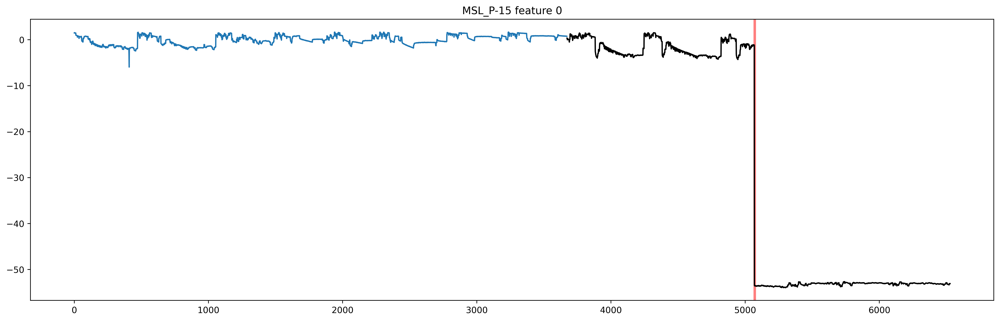

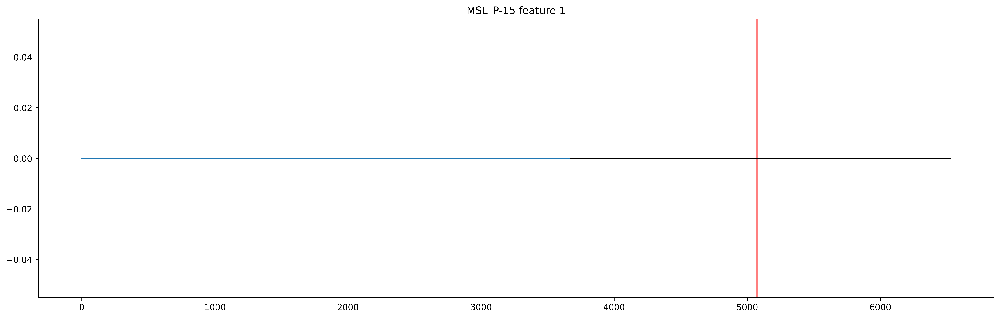

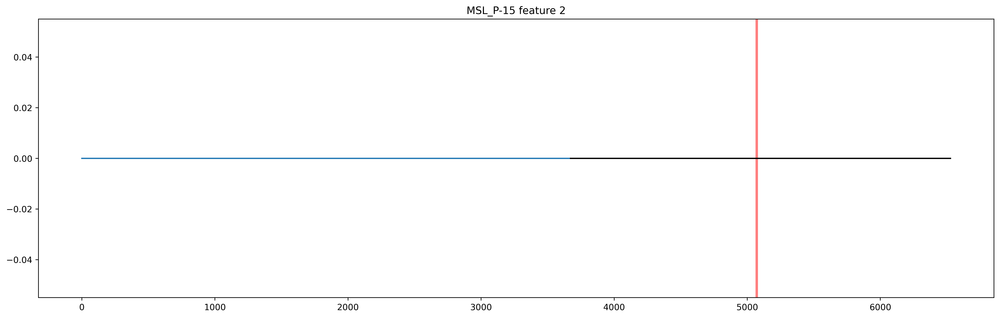

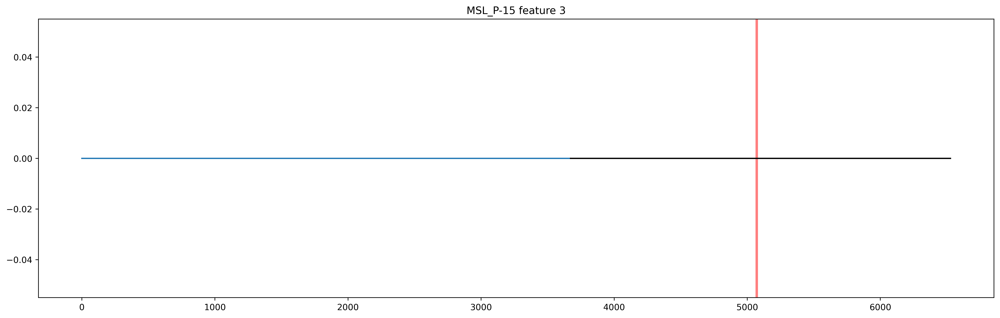

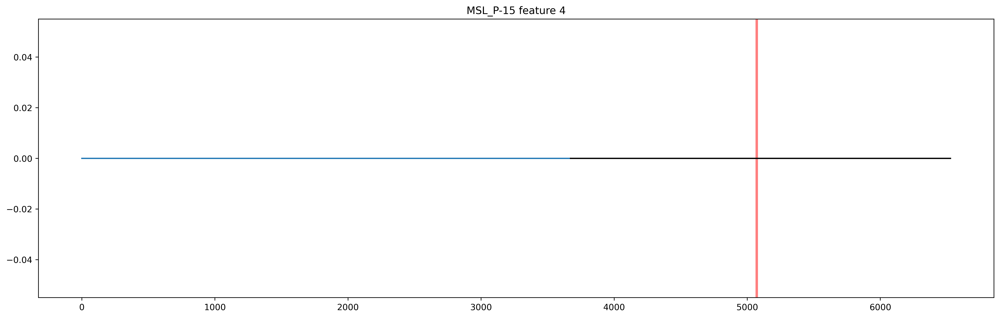

...

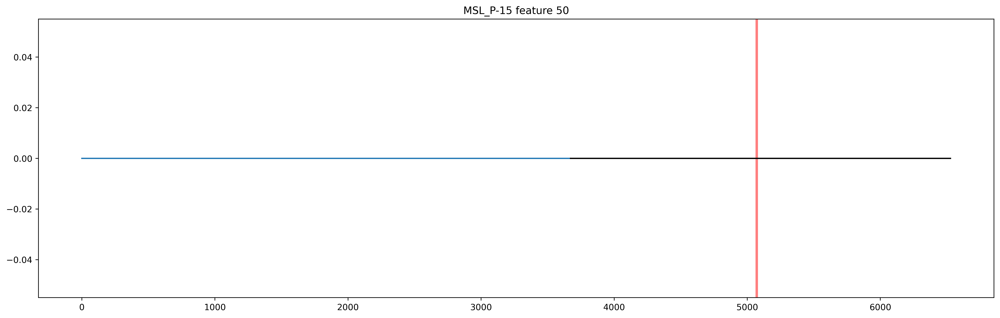

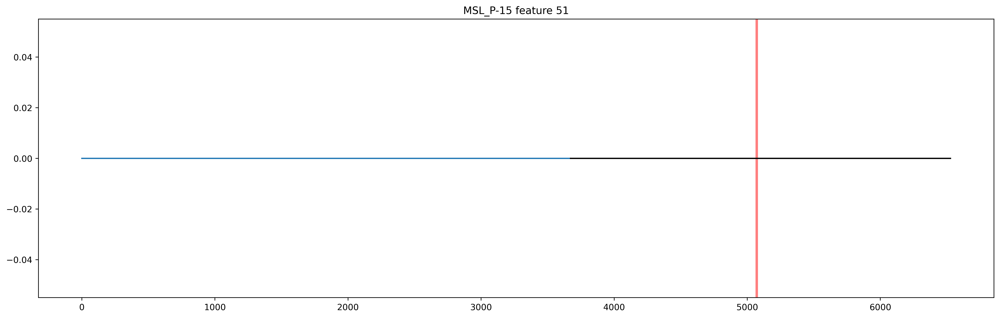

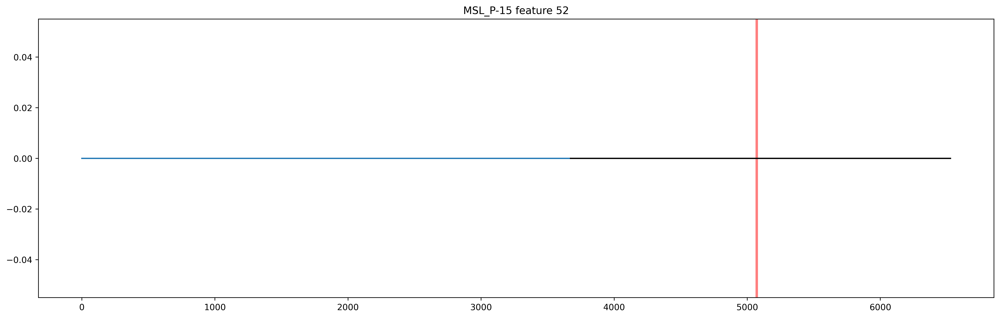

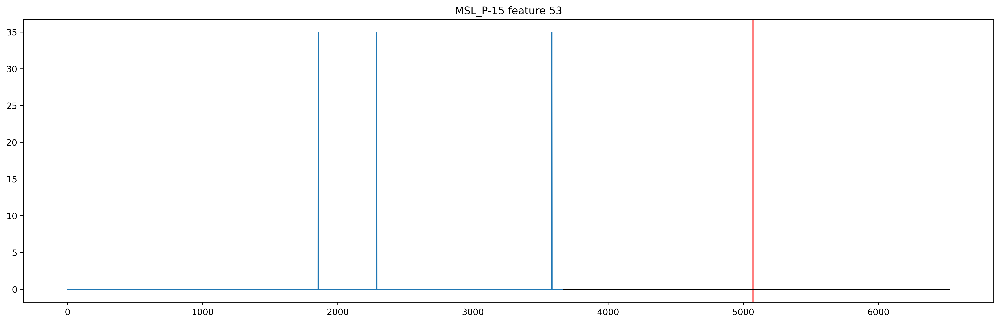

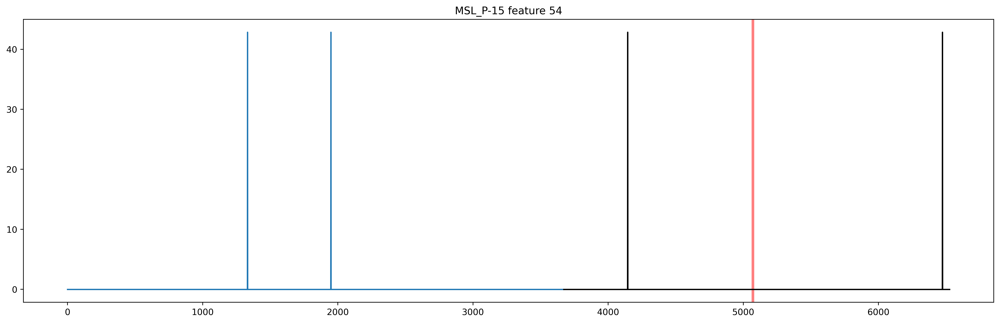

In [9]:
for c in range(args.num_channels):
    dataset_name = "MSL_P-15"
    plt.figure(figsize=(20, 6), dpi=500)
    plt.plot(train_X[:, c], color="C0")
    plt.plot(range(len(train_X), len(train_X)+len(test_X)), test_X[:, c], color="black")
    label = np.concatenate([np.array([0]*len(train_X)), test_y])
    plot_interval(plt, label)
    plt.title(f"{dataset_name} feature {c}")
    plt.show()

## Load Model

In [95]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN", f"best.pth"))

[2023-04-29 22:46:24,115] loading: ./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-29 22:46:24,123] train_errors.pt file exists, loading...
[2023-04-29 22:46:24,124] torch.Size([306, 12])
[2023-04-29 22:46:24,126] test_errors.pt file exists, loading...
[2023-04-29 22:46:24,127] torch.Size([238, 12])
[2023-04-29 22:46:24,130] loading: ./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict


In [96]:
next(iter(tester.model.parameters())).device, next(iter(tester.model.parameters())).requires_grad

(device(type='cuda', index=0), True)

In [97]:
tester.model.state_dict()

OrderedDict([('encoder.linear1.weight',
              tensor([[ 0.0039, -0.0219, -0.0247,  ..., -0.0116,  0.0546, -0.0041],
                      [ 0.0271,  0.0020, -0.0202,  ...,  0.0146, -0.0793, -0.0461],
                      [-0.0422, -0.0115,  0.0232,  ..., -0.0312, -0.0508, -0.0166],
                      ...,
                      [ 0.0030,  0.0218,  0.0254,  ..., -0.0077, -0.0354, -0.0356],
                      [ 0.0619, -0.0108, -0.0254,  ..., -0.0006,  0.0473,  0.0543],
                      [ 0.0089,  0.0266, -0.0136,  ...,  0.0291,  0.0395,  0.0578]],
                     device='cuda:0')),
             ('encoder.linear1.bias',
              tensor([-0.0504,  0.0740,  0.0487, -0.0574, -0.0086,  0.0457, -0.0494, -0.0243,
                       0.0288,  0.0179, -0.0067, -0.0227,  0.0502, -0.0240, -0.0283,  0.0144,
                      -0.0147,  0.0088,  0.0057, -0.0693, -0.0147, -0.0285, -0.0380, -0.0418,
                       0.0297, -0.0420, -0.0156, -0.0139,  0.0335, -

## Training statistics

In [112]:
train_iterator = tqdm(
    tester.train_loader,
    total=len(tester.train_loader),
    desc="calculating reconstruction errors",
    leave=True
)

recon_errors = []
with torch.no_grad():
    for i, batch_data in enumerate(train_iterator):
        X = batch_data[0].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        recon_error = torch.nn.functional.mse_loss(Xhat, X, reduction='none')
        recon_errors.append(recon_error)

recon_errors = torch.cat(recon_errors, axis=0)
recon_errors = recon_errors.reshape(-1, args.num_channels)
train_error_dist = recon_errors.mean(dim=1)

print(f"{recon_errors.shape}, {train_error_dist.shape}")

calculating reconstruction errors: 100%|██████████| 5/5 [00:00<00:00, 44.37it/s]

torch.Size([3672, 55]), torch.Size([3672])


In [113]:
th = torch.quantile(train_error_dist, 0.995).item()
th

6.669537544250488

## Test: static threshold inference

In [114]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

anoscs_prev = []
Xhats_prev = []

Zs = []
Zyt = []
Zy = []

with torch.no_grad():
    for i, batch_data in enumerate(eval_iterator):
        X, y = batch_data[0].to(args.device), batch_data[1].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        Xhats_prev.append(Xhat)
        
        E = (Xhat-X)**2
        A = E.mean(dim=2)
        ytilde = (A > th).float()
        
        with torch.no_grad():
            z = tester.model.encoder(_nX.reshape(B, L*C))
            zytilde = np.array([1 in ytilde])
            zy = np.array([1 in y])
            Zs.append(z)
            Zyt.append(zytilde)
            Zy.append(zy)
        
        
        e = F.mse_loss(Xhat, X, reduction='none')
        anosc = e.mean(dim=2)
        anoscs_prev.append(anosc)

Xhats_prev = torch.cat(Xhats_prev, axis=0).detach().cpu().numpy()
anoscs_prev = torch.cat(anoscs_prev, axis=0).reshape(-1).detach().cpu().numpy()
Zs = torch.cat(Zs, axis=0).cpu().numpy()
Zyt = np.stack(Zyt)
Zy = np.stack(Zy)

calculating reconstruction errors: 100%|██████████| 238/238 [00:00<00:00, 903.73it/s]


In [115]:
anoscs_prev.shape

(2856,)

In [116]:
th_q95 = torch.quantile(train_error_dist, 0.95).item()
th_q99 = torch.quantile(train_error_dist, 0.99).item()
th_q100 = torch.max(train_error_dist).item()
th_best_static = get_best_static_threshold(gt=test_y, anomaly_scores=anoscs_prev)
th_q95, th_q99, th_q100, th_best_static

(0.8373491168022156, 4.297241687774658, 29.614288330078125, 12.159677)

In [117]:
# 95
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q95))
# 99
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q99))
# 100
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q100))
# oracle
print(get_summary_stats(test_dataset.y, anoscs_prev > th_best_static))

{'Accuracy': 0.4730392156862745, 'Precision': 0.011834319526627219, 'Recall': 0.9, 'F1': 0.02336145360155743, 'tn': 1333, 'fp': 1503, 'fn': 2, 'tp': 18, 'Accuracy_PA': 0.4737394957983193, 'Precision_PA': 0.013131976362442548, 'Recall_PA': 1.0, 'F1_PA': 0.025923525599481533, 'tn_PA': 1333, 'fp_PA': 1503, 'fn_PA': 0, 'tp_PA': 20}
{'Accuracy': 0.8207282913165266, 'Precision': 0.026923076923076925, 'Recall': 0.7, 'F1': 0.05185185185185185, 'tn': 2330, 'fp': 506, 'fn': 6, 'tp': 14, 'Accuracy_PA': 0.822829131652661, 'Precision_PA': 0.03802281368821293, 'Recall_PA': 1.0, 'F1_PA': 0.07326007326007325, 'tn_PA': 2330, 'fp_PA': 506, 'fn_PA': 0, 'tp_PA': 20}
{'Accuracy': 0.992296918767507, 'Precision': 0.0, 'Recall': 0.0, 'F1': 0.0, 'tn': 2834, 'fp': 2, 'fn': 20, 'tp': 0, 'Accuracy_PA': 0.992296918767507, 'Precision_PA': 0.0, 'Recall_PA': 0.0, 'F1_PA': 0.0, 'tn_PA': 2834, 'fp_PA': 2, 'fn_PA': 20, 'tp_PA': 0}
{'Accuracy': 0.9527310924369747, 'Precision': 0.08633093525179857, 'Recall': 0.6, 'F1': 0.

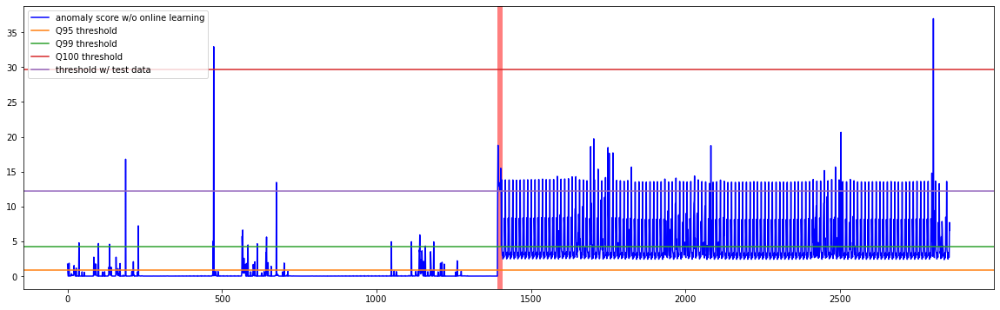

In [118]:
plt.figure(figsize=(20, 6))
#lt.ylim([-2, 5])
plt.plot(anoscs_prev, color="blue", label="anomaly score w/o online learning")
#plt.plot(anoscs, color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="C1", label="Q95 threshold")
plt.axhline(th_q99, color="C2", label="Q99 threshold")
plt.axhline(th_q100, color="C3", label="Q100 threshold")
plt.axhline(th_best_static, color="C4", label="threshold w/ test data")

#plt.plot(thrs, color="gold",label="dynamic threshold")
plt.legend()
plot_interval(plt, test_y)
plt.show()

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 238 samples in 0.000s...
[t-SNE] Computed neighbors for 238 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 238 / 238
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 108.539993
[t-SNE] KL divergence after 300 iterations: 2.588925


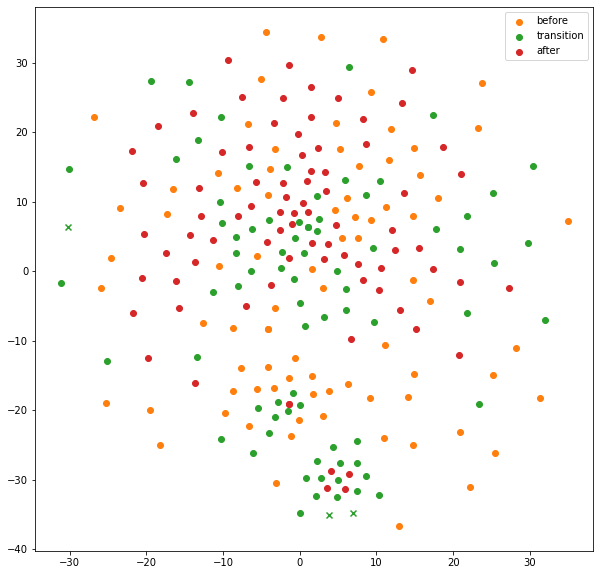

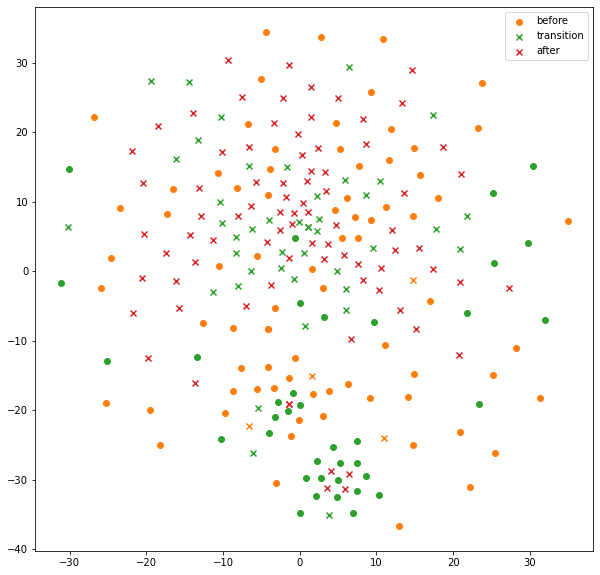

In [119]:
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=3)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]

a, b = 79, 79*2
dx1, dy1, L1, P1 = tx[:a], ty[:a], Zy[:a].squeeze(1), Zyt[:a].squeeze(1)
dx2, dy2, L2, P2 = tx[a:b], ty[a:b], Zy[a:b].squeeze(1), Zyt[a:b].squeeze(1)
dx3, dy3, L3, P3 = tx[b:], ty[b:], Zy[b:].squeeze(1), Zyt[b:].squeeze(1)

plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, L1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, L2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, L3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()



plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, P1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, P2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, P3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()

## Value-based Pseudo-label guided Online Learning (separate threshold)

### 1. Single+CE

In [191]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN", f"best.pth"))

[2023-04-29 23:03:57,862] loading: ./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-29 23:03:57,868] train_errors.pt file exists, loading...
[2023-04-29 23:03:57,870] torch.Size([306, 12])
[2023-04-29 23:03:57,871] test_errors.pt file exists, loading...
[2023-04-29 23:03:57,873] torch.Size([238, 12])
[2023-04-29 23:03:57,876] loading: ./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict


In [192]:
tester.model.normalizer.gamma = 0.5
tester.model.normalizer.gamma

0.5

In [193]:
tester.model

MLP(
  (encoder): Encoder(
    (linear1): Linear(in_features=660, out_features=330, bias=True)
    (relu1): ReLU()
    (linear2): Linear(in_features=330, out_features=165, bias=True)
    (relu2): ReLU()
    (linear3): Linear(in_features=165, out_features=16, bias=True)
    (relu3): ReLU()
  )
  (decoder): Decoder(
    (linear1): Linear(in_features=16, out_features=165, bias=True)
    (relu1): ReLU()
    (linear2): Linear(in_features=165, out_features=330, bias=True)
    (relu2): ReLU()
    (linear3): Linear(in_features=330, out_features=660, bias=True)
  )
  (normalizer): SlowRevIN()
)

In [194]:
th

6.669537544250488

In [195]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 0.001
TT_optimizer = torch.optim.SGD([p for p in tester.model.parameters()], lr=lr)

Xs, Xhats = [], []
Xmus = []
yhats = []
preds = []
As, thrs =[], []


Zs = []
Zyt = []
Zy = []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    tester.model.normalizer._update_statistics(X)
    
    Xhat = tester.model(X)
    E = (Xhat-X)**2
    A = E.mean(dim=2)
    ytilde = (A > th).float()
    pred = ytilde
    
    with torch.no_grad():
        _nX = tester.model.normalizer(X, "norm") 
        z = tester.model.encoder(_nX.reshape(B, L*C))
        zytilde = np.array([1 in ytilde])
        zy = np.array([1 in y])
        Zs.append(z)
        Zyt.append(zytilde)
        Zy.append(zy)
        
        
    # log source model outputs
    Xs.append(X)
    Xmus.append(tester.model.normalizer.mean.clone().detach().repeat(1,L,1))
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(th)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    recon_loss = (A*mask).mean()
    recon_loss.backward()
    
    TT_optimizer.step()
    
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()
Xmus = torch.cat(Xmus, axis=0).detach().cpu().numpy().reshape(-1, args.num_channels)

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

Zs = torch.cat(Zs, axis=0).cpu().numpy()
Zyt = np.stack(Zyt)
Zy = np.stack(Zy)

calculating reconstruction errors: 100%|██████████| 238/238 [00:00<00:00, 266.68it/s]


In [196]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

(2856,) (2856,)
{'Accuracy': 0.9947478991596639, 'Precision': 0.631578947368421, 'Recall': 0.6, 'F1': 0.6153846153846154, 'tn': 2829, 'fp': 7, 'fn': 8, 'tp': 12, 'Accuracy_PA': 0.9975490196078431, 'Precision_PA': 0.7407407407407407, 'Recall_PA': 1.0, 'F1_PA': 0.851063829787234, 'tn_PA': 2829, 'fp_PA': 7, 'fn_PA': 0, 'tp_PA': 20}


[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 238 samples in 0.000s...
[t-SNE] Computed neighbors for 238 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 238 / 238
[t-SNE] Mean sigma: 0.016232
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.094231
[t-SNE] KL divergence after 300 iterations: 0.854115


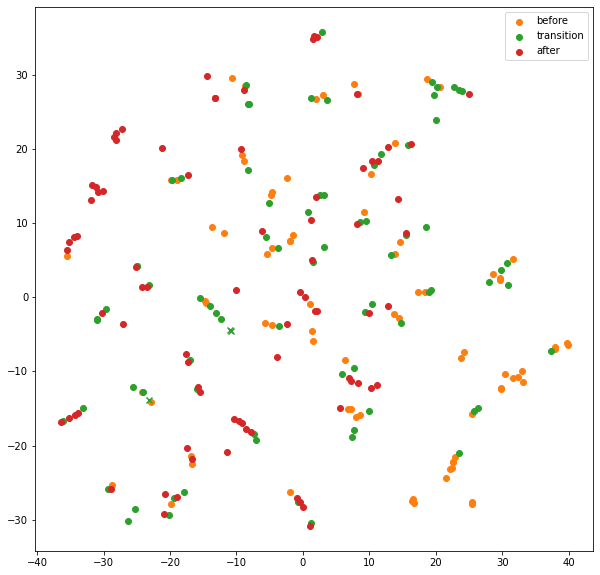

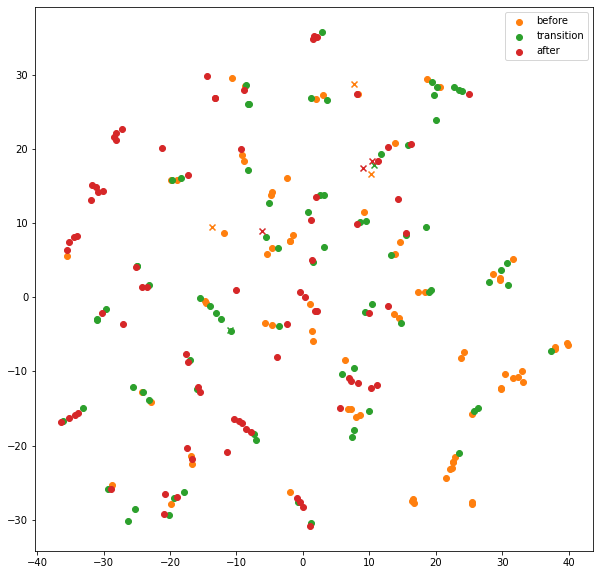

In [197]:
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=3)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]

a, b = 79, 79*2
dx1, dy1, L1, P1 = tx[:a], ty[:a], Zy[:a].squeeze(1), Zyt[:a].squeeze(1)
dx2, dy2, L2, P2 = tx[a:b], ty[a:b], Zy[a:b].squeeze(1), Zyt[a:b].squeeze(1)
dx3, dy3, L3, P3 = tx[b:], ty[b:], Zy[b:].squeeze(1), Zyt[b:].squeeze(1)

plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, L1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, L2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, L3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()



plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, P1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, P2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, P3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()

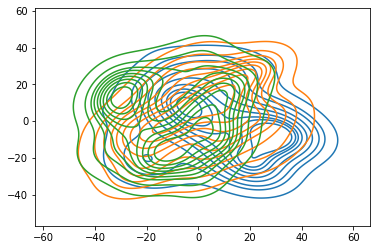

In [198]:
sns.kdeplot(dx1, dy1)
#plt.show()
sns.kdeplot(dx2, dy2)
#plt.show()
sns.kdeplot(dx3, dy3)
plt.show()

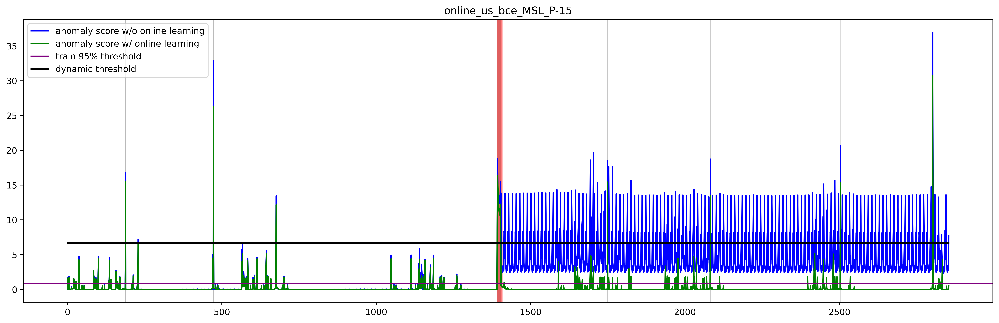

In [199]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
#plt.ylim([-1, 10])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
plot_interval(plt, test_y[s:e])
plt.legend()
plt.show()

In [201]:
Xmus.shape

(2856, 55)

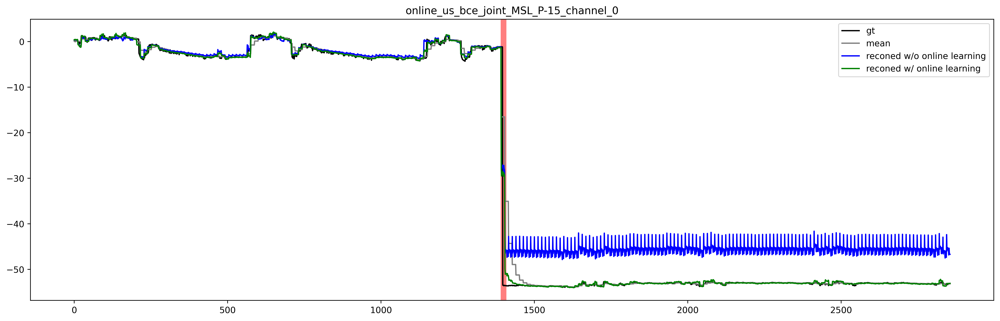

In [202]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xmus[:, c], color="C7", label="mean")
    
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), color="green", label="reconed w/ online learning")
    plt.legend()
    plot_interval(plt, test_y)
    break